## **1. Import packages**

In [1]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
from torchvision.io import read_image
import numpy as np
from PIL import Image

# Generation imports
import librosa
import librosa.display
import os
from numpy.fft import *
import matplotlib.pyplot as plt
import math
import wave
import struct
from scipy.io import wavfile

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

## **0. Generate Dataset**

In [22]:
# Dataset generation and loading helpers
# Should implement batching

def lerp(img, min=0, max=1):
    img_std = (img - img.min()) / (img.max() - img.min())
    return img_std * (max - min) + min


# Stolen from https://dsp.stackexchange.com/questions/72027/python-audio-analysis-which-spectrogram-should-i-use-and-why
# No idea if this is at all decent but works better than scipy.signal.spectrogram on random files i got
def wav_to_spectrogram(in_path):
    y, sr = librosa.load(in_path, sr=None)
    mels = librosa.feature.melspectrogram(y, sr)
    print("max", mels.max(), "min", mels.min())
    mels = np.log(mels + 1e-9)
    print("log max", mels.max(), "min", mels.min())
    
    img = lerp(mels, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0)
    img = 255-img

    plt.imshow(img.astype('float') / 255.0)
    return img
    
#     window_size = 1024
#     hop_length = 512
#     n_mels = 128
#     time_steps = 384
#     window = np.hanning(window_size)
#     stft = librosa.core.spectrum.stft(x, n_fft = window_size, hop_length = hop_length, window = window)
#     out = 2 * np.abs(stft) / np.sum(window)

#     # data = librosa.amplitude_to_db(out, ref=np.max)
#     # data = np.log(data + 1e-9)

#     # plt.imsave(out_path + ".png", data, cmap='hot')

#     fig = plt.figure(figsize = (12,4))
#     librosa.display.specshow(librosa.amplitude_to_db(out, ref=np.max), y_axis='log', x_axis='time', sr=sr)
#     plt.axis('off')
#     plt.set_cmap('hot')
#     plt.savefig(out_path, bbox_inches = 'tight', transparent = True, pad_inches = 0.0)
#     plt.clf()
#     plt.close(fig)
    
def spectrogram_to_wav(spectrogram, out_path, sr=44100):
    img = 255-spectrogram # Undo inversion
    img = np.flip(img, axis=0) # Undo flip
    img = lerp(img.astype('float'), -20.5, 2.4)
    img = np.exp(img)
    out = librosa.feature.inverse.mel_to_audio(img, sr=sr)
    
    wavfile.write(out_path, sr, out)

# Creates spectrogram dataset from two identically indexed directories of wav files
def create_spectrogram_dataset(x_dir, y_dir, target_dir):
    for (file_x, file_y) in zip(os.listdir(x_dir), os.listdir(y_dir)):
        file_name = file_x.split(".")[0]
        file_dir = os.path.join(target_dir, file_name)
        if not os.path.isdir(file_dir):
            os.mkdir(file_dir)
            
        plt.imsave(
            os.path.join(file_dir, file_name + "_x.png"),
            wav_to_spectrogram(os.path.join(x_dir, file_x))
        )
        plt.imsave(
            os.path.join(file_dir, file_name + "_y.png"),
             wav_to_spectrogram(os.path.join(y_dir, file_y)) 
        )
        print("Generated ", file_name, "...")

In [3]:
def imshow(img):
    npimg = img.numpy()
    # npimg = (npimg * 255).transpose(1,2,0).astype(np.uint8)
    plt.figure(figsize = (20,20))
    plt.imshow(img.permute(1,2,0), interpolation='nearest')
    plt.show()

# Split is tensor of shape [t, c, h, w]
def stitch(split):
    return torch.cat(list(map(lambda t : t[0,:,:], torch.tensor_split(split, split.shape[0]))), dim=2)

## **2. Dataset**

In [4]:
class SpectrogramDataset(data.Dataset):
    def __init__(self, root, train, crop_size=None):
        super(SpectrogramDataset, self).__init__()

        self.root = root
        self.split_spectrograms = {}
        self.crop_size = crop_size

    def __len__(self):
        return len(os.listdir(self.root))

    def __getitem__(self, i):
        i_name = sorted(os.listdir(self.root))[i]
        i_path = os.path.join(self.root, i_name)
        [x_path, y_path] = map(lambda path : os.path.join(i_path, path), sorted(os.listdir(i_path)))
        x = read_image(x_path, mode=torchvision.io.ImageReadMode.RGB).float() / 255.0
        y = read_image(y_path, mode=torchvision.io.ImageReadMode.RGB).float() / 255.0

        if self.crop_size:
            x = x[:,:self.crop_size[0],:self.crop_size[1]]
            y = y[:,:self.crop_size[0],:self.crop_size[1]]
                
        return x, y

## **3. Network**

In [5]:
class Model(nn.Module):
    def __init__(self, img_size, hidden_dim, latent_size, batch_size, chunk_counts=(1,1)):
        
        super(Model, self).__init__()
        
        self.hidden_dim_1 = 8
        self.hidden_dim_2 = 16
        self.img_size = img_size
        
        # New approach for chunking
        self.chunk_counts = chunk_counts
        self.chunk_size = (int(img_size[0]/chunk_counts[0]), int(img_size[1]/chunk_counts[1]))
                
        self.encoder_conv1 = nn.Conv2d(3, self.hidden_dim_1, (1,5), padding=(0,2))
        self.encoder_conv2 = nn.Conv2d(self.hidden_dim_1, self.hidden_dim_2, (1,5), padding=(0,2))
        
        self.encoder_linear = nn.Linear(
            batch_size * self.hidden_dim_2 * self.chunk_size[0] * self.chunk_size[1], 
            latent_size + latent_size
        )
        
        nn.init.uniform_(self.encoder_conv1.weight, -1e-10, 1e-10)
        nn.init.uniform_(self.encoder_conv2.weight, -1e-10, 1e-10)
        nn.init.uniform_(self.encoder_linear.weight, -1e-10, 1e-10)
        
        self.decoder_linear = nn.Linear(
            latent_size, 
            batch_size * self.hidden_dim_2 * self.chunk_size[0] * self.chunk_size[1]
        )
            
        self.decoder_conv1 = nn.Conv2d(self.hidden_dim_2, self.hidden_dim_1, (5,1), padding=(2,0))
        self.decoder_conv2 = nn.Conv2d(self.hidden_dim_1, 3, (5,1), padding=(2,0))
        
        self.debug = False
        
    def forward(self, x):
        b, _, h, w = x.size()
        
        if self.debug:
            print(x.shape)
        
        output = torch.randn_like(x)
        total_mean, total_logvar = 0, 0

        for c_x in range(self.chunk_counts[0]):
            for c_y in range(self.chunk_counts[1]):
                chunk = x[:,:,
                          c_y*self.chunk_size[1]:(c_y+1)*self.chunk_size[1],
                          c_x*self.chunk_size[0]:(c_x+1)*self.chunk_size[0]
                         ]
                
                if self.debug:
                    print("chunk", (c_x, c_y), "has shape", chunk.shape)
                    print("x dimensions", (c_x*self.chunk_size[0],(c_x+1)*self.chunk_size[0]),
                         "y dimensions", (c_y*self.chunk_size[1],(c_y+1)*self.chunk_size[1])
                         )
                
#                 print("chunk", (c_x, c_y), chunk.shape, "x", (c_x*self.chunk_size[0],(c_x+1)*self.chunk_size[0]), "y", (c_y*self.chunk_size[1],(c_y+1)*self.chunk_size[1]))

    #                 print("chunk", i, ",", j, "shape", chunk.shape)
    #                 print("chunk range x", i*self.chunk_size[1],",",(i+1)*self.chunk_size[1],"y",j*self.chunk_size[0],",",(j+1)*self.chunk_size[0])
    #                 print(b, self.hidden_dim_2, self.chunk_size[1], self.chunk_size[0])

                ec1 = F.relu(self.encoder_conv1(chunk)).cuda()
                ec2 = F.relu(self.encoder_conv2(ec1)).cuda()
                # el = self.encoder_linear(ec2.view(b * self.hidden_dim_2 * h * w)).cuda()
                el = self.encoder_linear(ec2.view(b * self.hidden_dim_2 * self.chunk_size[0] * self.chunk_size[1])).cuda()

                mean, logvar = torch.chunk(el, 2)
                total_mean += mean
                total_logvar += logvar

                eps = torch.randn_like(mean, device=torch.device('cuda'))
                std = torch.exp(logvar * 0.5)

                sample = (mean + std * eps).cuda()

                dl = F.relu(self.decoder_linear(sample))
                dc1 = F.relu(self.decoder_conv1(dl.view(b, self.hidden_dim_2, self.chunk_size[1], self.chunk_size[0])))
                dc2 = torch.sigmoid(self.decoder_conv2(dc1))
                
#                 print("dc2",dc2.shape)


                if torch.max(dc2) > 1.0 or torch.min(dc2) < -1.0:
                    print("Warning: dc2 max", torch.max(dc2), "and min", torch.min(dc2))

                output[:,:,
                          c_y*self.chunk_size[1]:(c_y+1)*self.chunk_size[1],
                          c_x*self.chunk_size[0]:(c_x+1)*self.chunk_size[0]
                      ] = dc2
                    
        total_chunks = self.chunk_counts[0] * self.chunk_counts[1]
        return total_mean / total_chunks, total_logvar / total_chunks, output        

## **5. Training**

In [6]:
train_set = SpectrogramDataset('mel_spectrogram_dataset/train', True, (128,3674))
test_set = SpectrogramDataset('mel_spectrogram_dataset/test', False, (128,3674))

# min_x = 1000000000
# min_y = 1000000000
# max_x = 0
# max_y = 0

# for i in range(len(train_set)):
#     min_x = min(min_x, train_set[i][0].shape[2])
#     min_y = min(min_y, train_set[i][0].shape[1])
#     max_x = max(max_x, train_set[i][0].shape[2])
#     max_y = max(max_y, train_set[i][0].shape[1])
    
# for i in range(len(test_set)):
#     min_x = min(min_x, test_set[i][0].shape[2])
#     min_y = min(min_y, test_set[i][0].shape[1])
#     max_x = max(max_x, test_set[i][0].shape[2])
#     max_y = max(max_y, test_set[i][0].shape[1])
    
    
# print("min_x", min_x)
# print("min_y", min_y)
# print("max_x", max_x)
# print("max_y", max_y)
    

# train_set = SpectrogramDataset('spectrogram_3', True, None)
# test_set = SpectrogramDataset('spectrogram_3', True, None)

batch_size = 1

train_loader = torch.utils.data.DataLoader(
                dataset=train_set,
                batch_size=batch_size,
                shuffle=True)

test_loader = torch.utils.data.DataLoader(
                dataset=test_set,
                batch_size=batch_size,
                shuffle=False)



In [7]:
# Compute loss
def compute_loss(y, y_hat, mean, log_var):
#     return nn.MSELoss()(y_hat, y)
    if torch.max(y_hat) > 1.0 or torch.min(y_hat) < 0.0:
        print("Warning: y_hat max of", torch.max(y_hat), "and y_hat min of", torch.min(y_hat))
    if torch.sum(torch.isnan(y_hat)) > 0:
        print("Warning: y_hat contains", torch.sum(torch.isnan(y_hat)), "nan values")
        
    if torch.max(y) > 1.0 or torch.min(y) < 0.0:
        print("Warning: y max of", torch.max(y), "and y min of", torch.min(y))
    if torch.sum(torch.isnan(y)) > 0:
        print("Warning: y contains", torch.sum(torch.isnan(y)), "nan values")
        
    kl_divergence = 0.5 * torch.sum(-1 - log_var + mean.pow(2) + logvar.exp())
    return F.binary_cross_entropy(y_hat, y, reduction='sum') + kl_divergence

# Evaluate network
def evaluate(net, data_loader):
    net.eval()
    
    Loss = 0
    count = 0
    with torch.no_grad():
        for i, batch in enumerate(data_loader):
            x, y = batch[0].to(device), batch[1].to(device)
            mean, logvar, y_hat = net.forward(x)
            
            loss = compute_loss(y, y_hat, mean, logvar)
            
            Loss += loss.item()
            count += 1
            
        avg_loss = Loss / count
        
    return avg_loss

Training start!


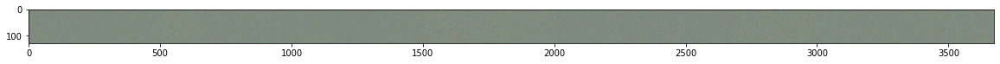

Epoch: [1/100], Step: [0], learning_rate: 0.001, loss: 984115.812500
Epoch: [1/100], Step: [20], learning_rate: 0.001, loss: 914281.625000
Epoch: [1/100], Step: [40], learning_rate: 0.001, loss: 882949.250000
Epoch: [1/100], Step: [60], learning_rate: 0.001, loss: 875582.875000
Epoch: [1/100], Step: [80], learning_rate: 0.001, loss: 873318.125000
Avg loss on test dataset: 872715.8979166667


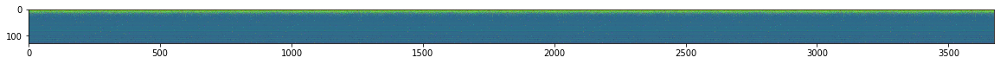

Epoch: [2/100], Step: [0], learning_rate: 0.001, loss: 873002.687500
Epoch: [2/100], Step: [20], learning_rate: 0.001, loss: 870750.437500
Epoch: [2/100], Step: [40], learning_rate: 0.001, loss: 870152.687500
Epoch: [2/100], Step: [60], learning_rate: 0.001, loss: 868403.750000
Epoch: [2/100], Step: [80], learning_rate: 0.001, loss: 868735.312500
Avg loss on test dataset: 869041.6229166667


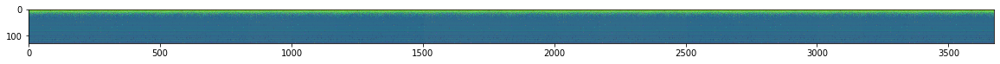

Epoch: [3/100], Step: [0], learning_rate: 0.001, loss: 867942.312500
Epoch: [3/100], Step: [20], learning_rate: 0.001, loss: 867182.937500
Epoch: [3/100], Step: [40], learning_rate: 0.001, loss: 866970.187500
Epoch: [3/100], Step: [60], learning_rate: 0.001, loss: 865919.625000
Epoch: [3/100], Step: [80], learning_rate: 0.001, loss: 866069.937500
Avg loss on test dataset: 866811.50625


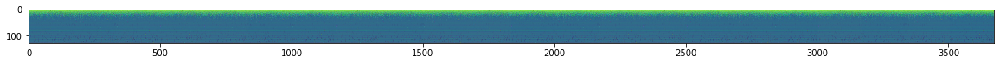

Epoch: [4/100], Step: [0], learning_rate: 0.001, loss: 865470.187500
Epoch: [4/100], Step: [20], learning_rate: 0.001, loss: 865790.687500
Epoch: [4/100], Step: [40], learning_rate: 0.001, loss: 865406.062500
Epoch: [4/100], Step: [60], learning_rate: 0.001, loss: 864948.375000
Epoch: [4/100], Step: [80], learning_rate: 0.001, loss: 864333.437500
Avg loss on test dataset: 864860.1479166667


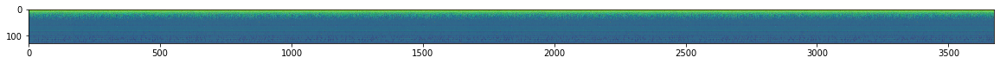

Epoch: [5/100], Step: [0], learning_rate: 0.001, loss: 864369.375000
Epoch: [5/100], Step: [20], learning_rate: 0.001, loss: 863822.187500
Epoch: [5/100], Step: [40], learning_rate: 0.001, loss: 862977.000000
Epoch: [5/100], Step: [60], learning_rate: 0.001, loss: 863255.687500
Epoch: [5/100], Step: [80], learning_rate: 0.001, loss: 862603.875000
Avg loss on test dataset: 863687.0333333333


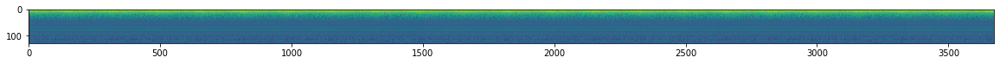

Epoch: [6/100], Step: [0], learning_rate: 0.001, loss: 862993.875000
Epoch: [6/100], Step: [20], learning_rate: 0.001, loss: 862898.937500
Epoch: [6/100], Step: [40], learning_rate: 0.001, loss: 862439.937500
Epoch: [6/100], Step: [60], learning_rate: 0.001, loss: 862385.312500
Epoch: [6/100], Step: [80], learning_rate: 0.001, loss: 861808.875000
Avg loss on test dataset: 862803.1270833333


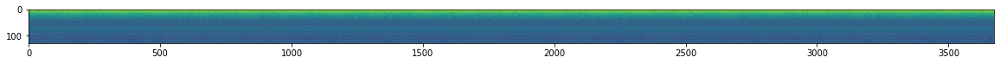

Epoch: [7/100], Step: [0], learning_rate: 0.001, loss: 860819.687500
Epoch: [7/100], Step: [20], learning_rate: 0.001, loss: 861883.187500
Epoch: [7/100], Step: [40], learning_rate: 0.001, loss: 862278.812500
Epoch: [7/100], Step: [60], learning_rate: 0.001, loss: 861749.437500
Epoch: [7/100], Step: [80], learning_rate: 0.001, loss: 861332.625000
Avg loss on test dataset: 862296.23125


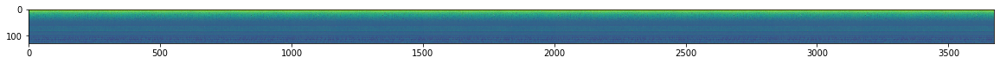

Epoch: [8/100], Step: [0], learning_rate: 0.001, loss: 861577.812500
Epoch: [8/100], Step: [20], learning_rate: 0.001, loss: 861805.625000
Epoch: [8/100], Step: [40], learning_rate: 0.001, loss: 861393.937500
Epoch: [8/100], Step: [60], learning_rate: 0.001, loss: 860790.312500
Epoch: [8/100], Step: [80], learning_rate: 0.001, loss: 860940.250000
Avg loss on test dataset: 862091.81875


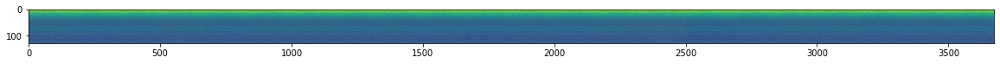

Epoch: [9/100], Step: [0], learning_rate: 0.001, loss: 860537.875000
Epoch: [9/100], Step: [20], learning_rate: 0.001, loss: 860620.500000
Epoch: [9/100], Step: [40], learning_rate: 0.001, loss: 861412.437500
Epoch: [9/100], Step: [60], learning_rate: 0.001, loss: 861426.437500
Epoch: [9/100], Step: [80], learning_rate: 0.001, loss: 860041.625000
Avg loss on test dataset: 861769.18125


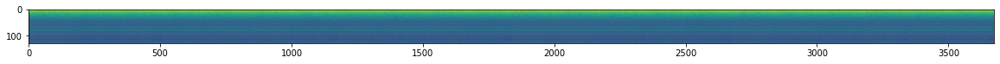

Epoch: [10/100], Step: [0], learning_rate: 0.001, loss: 861058.875000
Epoch: [10/100], Step: [20], learning_rate: 0.001, loss: 860707.875000
Epoch: [10/100], Step: [40], learning_rate: 0.001, loss: 861302.437500
Epoch: [10/100], Step: [60], learning_rate: 0.001, loss: 862179.750000
Epoch: [10/100], Step: [80], learning_rate: 0.001, loss: 859616.875000
Avg loss on test dataset: 861597.5354166667


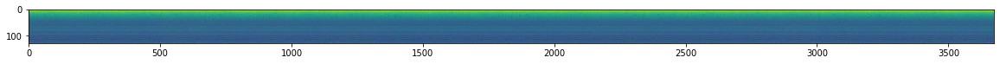

Epoch: [11/100], Step: [0], learning_rate: 0.001, loss: 860497.062500
Epoch: [11/100], Step: [20], learning_rate: 0.001, loss: 860615.312500
Epoch: [11/100], Step: [40], learning_rate: 0.001, loss: 861431.312500
Epoch: [11/100], Step: [60], learning_rate: 0.001, loss: 860423.875000
Epoch: [11/100], Step: [80], learning_rate: 0.001, loss: 860257.062500
Avg loss on test dataset: 861473.4208333333


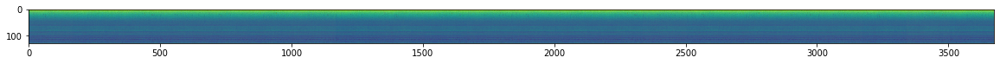

Epoch: [12/100], Step: [0], learning_rate: 0.001, loss: 860712.000000
Epoch: [12/100], Step: [20], learning_rate: 0.001, loss: 859664.312500
Epoch: [12/100], Step: [40], learning_rate: 0.001, loss: 860342.437500
Epoch: [12/100], Step: [60], learning_rate: 0.001, loss: 860076.687500
Epoch: [12/100], Step: [80], learning_rate: 0.001, loss: 860634.187500
Avg loss on test dataset: 861426.2270833333


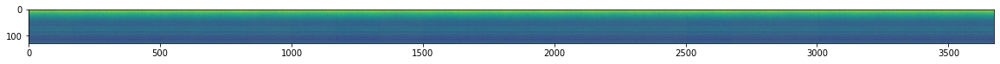

Epoch: [13/100], Step: [0], learning_rate: 0.001, loss: 860196.375000
Epoch: [13/100], Step: [20], learning_rate: 0.001, loss: 861965.875000
Epoch: [13/100], Step: [40], learning_rate: 0.001, loss: 860768.687500
Epoch: [13/100], Step: [60], learning_rate: 0.001, loss: 861055.500000
Epoch: [13/100], Step: [80], learning_rate: 0.001, loss: 860443.437500
Avg loss on test dataset: 861373.81875


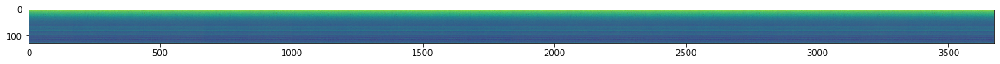

Epoch: [14/100], Step: [0], learning_rate: 0.001, loss: 859968.437500
Epoch: [14/100], Step: [20], learning_rate: 0.001, loss: 859715.625000
Epoch: [14/100], Step: [40], learning_rate: 0.001, loss: 859483.625000
Epoch: [14/100], Step: [60], learning_rate: 0.001, loss: 860530.312500
Epoch: [14/100], Step: [80], learning_rate: 0.001, loss: 860265.937500
Avg loss on test dataset: 861309.1833333333


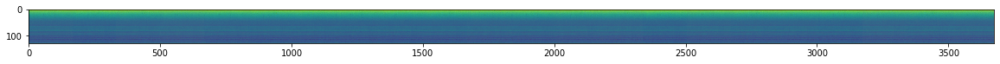

Epoch: [15/100], Step: [0], learning_rate: 0.001, loss: 860727.375000
Epoch: [15/100], Step: [20], learning_rate: 0.001, loss: 860681.000000
Epoch: [15/100], Step: [40], learning_rate: 0.001, loss: 860382.250000
Epoch: [15/100], Step: [60], learning_rate: 0.001, loss: 859963.875000
Epoch: [15/100], Step: [80], learning_rate: 0.001, loss: 860199.500000
Avg loss on test dataset: 861187.2458333333


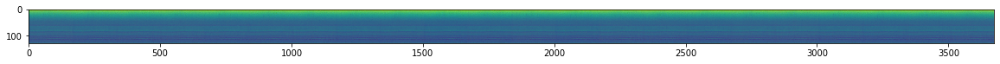

Epoch: [16/100], Step: [0], learning_rate: 0.001, loss: 859672.812500
Epoch: [16/100], Step: [20], learning_rate: 0.001, loss: 859917.000000
Epoch: [16/100], Step: [40], learning_rate: 0.001, loss: 860847.750000
Epoch: [16/100], Step: [60], learning_rate: 0.001, loss: 860041.375000
Epoch: [16/100], Step: [80], learning_rate: 0.001, loss: 860572.125000
Avg loss on test dataset: 861241.9083333333


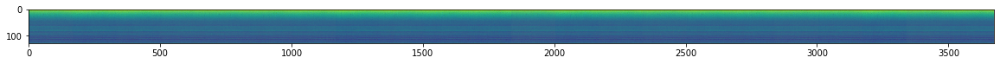

Epoch: [17/100], Step: [0], learning_rate: 0.001, loss: 860253.812500
Epoch: [17/100], Step: [20], learning_rate: 0.001, loss: 860366.375000
Epoch: [17/100], Step: [40], learning_rate: 0.001, loss: 859922.687500
Epoch: [17/100], Step: [60], learning_rate: 0.001, loss: 860244.375000
Epoch: [17/100], Step: [80], learning_rate: 0.001, loss: 859822.062500
Avg loss on test dataset: 861176.9


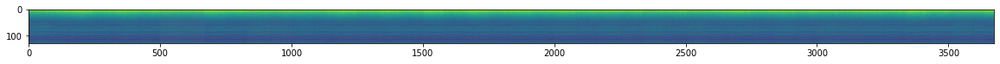

Epoch: [18/100], Step: [0], learning_rate: 0.001, loss: 860338.187500
Epoch: [18/100], Step: [20], learning_rate: 0.001, loss: 859731.125000
Epoch: [18/100], Step: [40], learning_rate: 0.001, loss: 860058.750000
Epoch: [18/100], Step: [60], learning_rate: 0.001, loss: 859943.875000
Epoch: [18/100], Step: [80], learning_rate: 0.001, loss: 859957.000000
Avg loss on test dataset: 861040.5


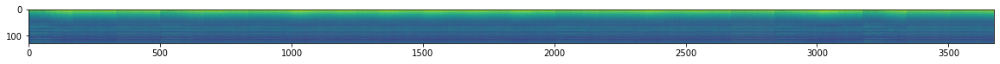

Epoch: [19/100], Step: [0], learning_rate: 0.001, loss: 860674.125000
Epoch: [19/100], Step: [20], learning_rate: 0.001, loss: 859024.062500
Epoch: [19/100], Step: [40], learning_rate: 0.001, loss: 859329.875000
Epoch: [19/100], Step: [60], learning_rate: 0.001, loss: 861209.500000
Epoch: [19/100], Step: [80], learning_rate: 0.001, loss: 858075.375000
Avg loss on test dataset: 860933.0979166667


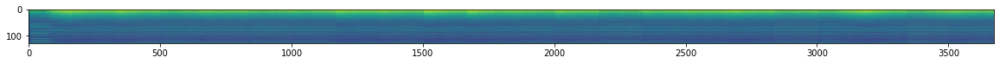

Epoch: [20/100], Step: [0], learning_rate: 0.001, loss: 858606.500000
Epoch: [20/100], Step: [20], learning_rate: 0.001, loss: 859024.437500
Epoch: [20/100], Step: [40], learning_rate: 0.001, loss: 858479.687500
Epoch: [20/100], Step: [60], learning_rate: 0.001, loss: 858657.625000
Epoch: [20/100], Step: [80], learning_rate: 0.001, loss: 859731.312500
Avg loss on test dataset: 860968.95


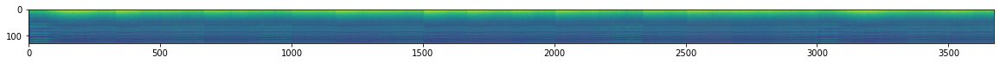

Epoch: [21/100], Step: [0], learning_rate: 0.001, loss: 859154.875000
Epoch: [21/100], Step: [20], learning_rate: 0.001, loss: 858758.937500
Epoch: [21/100], Step: [40], learning_rate: 0.001, loss: 859212.187500
Epoch: [21/100], Step: [60], learning_rate: 0.001, loss: 858279.250000
Epoch: [21/100], Step: [80], learning_rate: 0.001, loss: 859963.375000
Avg loss on test dataset: 860721.4229166667


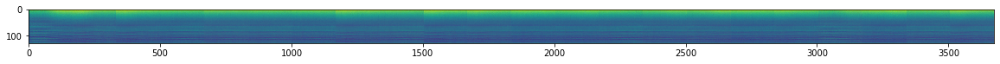

Epoch: [22/100], Step: [0], learning_rate: 0.001, loss: 859037.562500
Epoch: [22/100], Step: [20], learning_rate: 0.001, loss: 859811.562500
Epoch: [22/100], Step: [40], learning_rate: 0.001, loss: 858989.687500
Epoch: [22/100], Step: [60], learning_rate: 0.001, loss: 858914.250000
Epoch: [22/100], Step: [80], learning_rate: 0.001, loss: 859529.875000
Avg loss on test dataset: 860696.1666666666


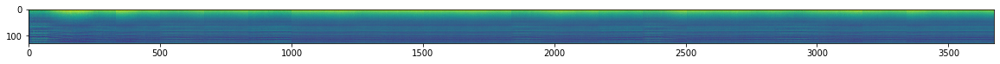

Epoch: [23/100], Step: [0], learning_rate: 0.001, loss: 858918.625000
Epoch: [23/100], Step: [20], learning_rate: 0.001, loss: 857830.812500
Epoch: [23/100], Step: [40], learning_rate: 0.001, loss: 857710.125000
Epoch: [23/100], Step: [60], learning_rate: 0.001, loss: 857479.875000
Epoch: [23/100], Step: [80], learning_rate: 0.001, loss: 858407.062500
Avg loss on test dataset: 860630.9625


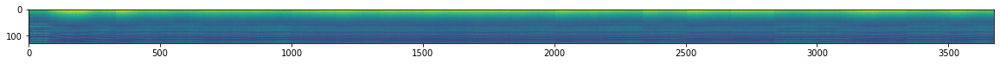

Epoch: [24/100], Step: [0], learning_rate: 0.001, loss: 857660.187500
Epoch: [24/100], Step: [20], learning_rate: 0.001, loss: 858070.937500
Epoch: [24/100], Step: [40], learning_rate: 0.001, loss: 859753.250000
Epoch: [24/100], Step: [60], learning_rate: 0.001, loss: 857811.500000
Epoch: [24/100], Step: [80], learning_rate: 0.001, loss: 856946.875000
Avg loss on test dataset: 860541.7895833333


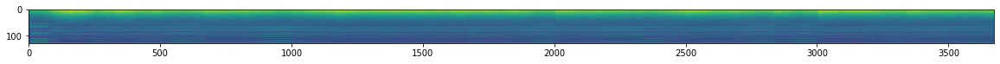

Epoch: [25/100], Step: [0], learning_rate: 0.001, loss: 858979.875000
Epoch: [25/100], Step: [20], learning_rate: 0.001, loss: 858580.375000
Epoch: [25/100], Step: [40], learning_rate: 0.001, loss: 858363.062500
Epoch: [25/100], Step: [60], learning_rate: 0.001, loss: 857602.937500
Epoch: [25/100], Step: [80], learning_rate: 0.001, loss: 858385.375000
Avg loss on test dataset: 860689.7541666667


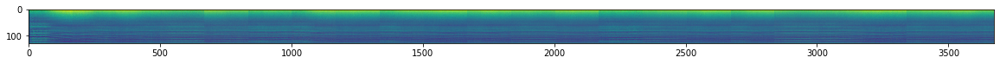

Epoch: [26/100], Step: [0], learning_rate: 0.001, loss: 858013.750000
Epoch: [26/100], Step: [20], learning_rate: 0.001, loss: 858124.625000
Epoch: [26/100], Step: [40], learning_rate: 0.001, loss: 858847.187500
Epoch: [26/100], Step: [60], learning_rate: 0.001, loss: 857480.375000
Epoch: [26/100], Step: [80], learning_rate: 0.001, loss: 861182.437500
Avg loss on test dataset: 860635.6083333333


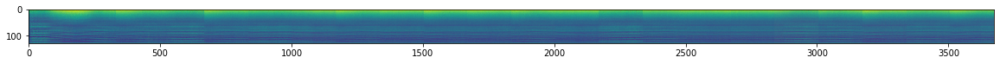

Epoch: [27/100], Step: [0], learning_rate: 0.001, loss: 858655.750000
Epoch: [27/100], Step: [20], learning_rate: 0.001, loss: 859090.500000
Epoch: [27/100], Step: [40], learning_rate: 0.001, loss: 858271.750000
Epoch: [27/100], Step: [60], learning_rate: 0.001, loss: 857236.875000
Epoch: [27/100], Step: [80], learning_rate: 0.001, loss: 859211.875000
Avg loss on test dataset: 860827.5229166667


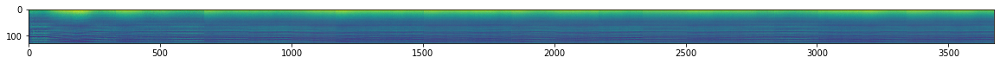

Epoch: [28/100], Step: [0], learning_rate: 0.001, loss: 858959.875000
Epoch: [28/100], Step: [20], learning_rate: 0.001, loss: 859436.062500
Epoch: [28/100], Step: [40], learning_rate: 0.001, loss: 858414.500000
Epoch: [28/100], Step: [60], learning_rate: 0.001, loss: 858929.562500
Epoch: [28/100], Step: [80], learning_rate: 0.001, loss: 858323.062500
Avg loss on test dataset: 860693.2541666667


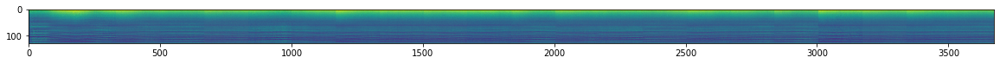

Epoch: [29/100], Step: [0], learning_rate: 0.001, loss: 858853.437500
Epoch: [29/100], Step: [20], learning_rate: 0.001, loss: 859620.812500
Epoch: [29/100], Step: [40], learning_rate: 0.001, loss: 857479.437500
Epoch: [29/100], Step: [60], learning_rate: 0.001, loss: 858833.812500
Epoch: [29/100], Step: [80], learning_rate: 0.001, loss: 857655.937500
Avg loss on test dataset: 860673.9583333334


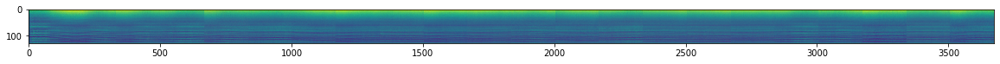

Epoch: [30/100], Step: [0], learning_rate: 0.001, loss: 859240.500000
Epoch: [30/100], Step: [20], learning_rate: 0.001, loss: 859480.437500
Epoch: [30/100], Step: [40], learning_rate: 0.001, loss: 857226.125000
Epoch: [30/100], Step: [60], learning_rate: 0.001, loss: 859994.062500
Epoch: [30/100], Step: [80], learning_rate: 0.001, loss: 857693.562500
Avg loss on test dataset: 860537.625


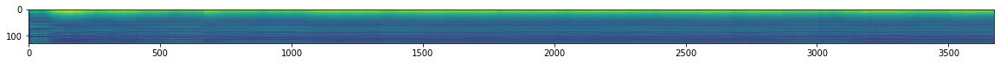

Epoch: [31/100], Step: [0], learning_rate: 0.001, loss: 859444.687500
Epoch: [31/100], Step: [20], learning_rate: 0.001, loss: 857059.125000
Epoch: [31/100], Step: [40], learning_rate: 0.001, loss: 858777.875000
Epoch: [31/100], Step: [60], learning_rate: 0.001, loss: 857757.375000
Epoch: [31/100], Step: [80], learning_rate: 0.001, loss: 858614.000000
Avg loss on test dataset: 860427.7979166667


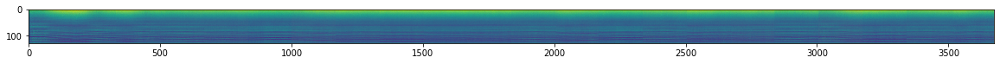

Epoch: [32/100], Step: [0], learning_rate: 0.001, loss: 857145.625000
Epoch: [32/100], Step: [20], learning_rate: 0.001, loss: 858247.625000
Epoch: [32/100], Step: [40], learning_rate: 0.001, loss: 857240.000000
Epoch: [32/100], Step: [60], learning_rate: 0.001, loss: 856459.437500
Epoch: [32/100], Step: [80], learning_rate: 0.001, loss: 857520.562500
Avg loss on test dataset: 860740.19375


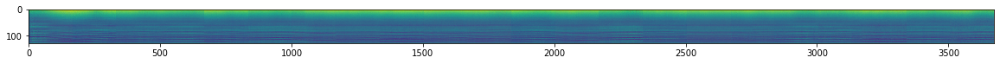

Epoch: [33/100], Step: [0], learning_rate: 0.001, loss: 857294.937500
Epoch: [33/100], Step: [20], learning_rate: 0.001, loss: 860069.812500
Epoch: [33/100], Step: [40], learning_rate: 0.001, loss: 858633.000000
Epoch: [33/100], Step: [60], learning_rate: 0.001, loss: 858443.312500
Epoch: [33/100], Step: [80], learning_rate: 0.001, loss: 860166.250000
Avg loss on test dataset: 860605.1229166667


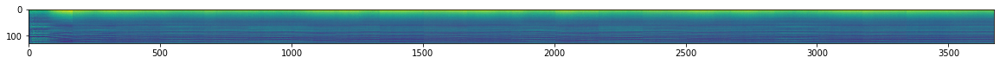

Epoch: [34/100], Step: [0], learning_rate: 0.001, loss: 861154.625000
Epoch: [34/100], Step: [20], learning_rate: 0.001, loss: 858726.437500
Epoch: [34/100], Step: [40], learning_rate: 0.001, loss: 855866.437500
Epoch: [34/100], Step: [60], learning_rate: 0.001, loss: 857479.500000
Epoch: [34/100], Step: [80], learning_rate: 0.001, loss: 857050.375000
Avg loss on test dataset: 860600.9645833333


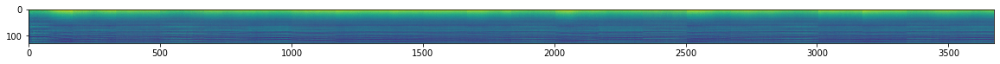

Epoch: [35/100], Step: [0], learning_rate: 0.001, loss: 857638.437500
Epoch: [35/100], Step: [20], learning_rate: 0.001, loss: 858640.812500
Epoch: [35/100], Step: [40], learning_rate: 0.001, loss: 857166.625000
Epoch: [35/100], Step: [60], learning_rate: 0.001, loss: 858613.562500
Epoch: [35/100], Step: [80], learning_rate: 0.001, loss: 861154.500000
Avg loss on test dataset: 860629.3520833333


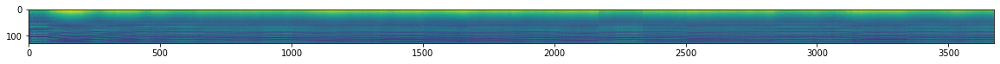

Epoch: [36/100], Step: [0], learning_rate: 0.001, loss: 856575.250000
Epoch: [36/100], Step: [20], learning_rate: 0.001, loss: 856727.375000
Epoch: [36/100], Step: [40], learning_rate: 0.001, loss: 857807.812500
Epoch: [36/100], Step: [60], learning_rate: 0.001, loss: 858624.125000
Epoch: [36/100], Step: [80], learning_rate: 0.001, loss: 857399.062500
Avg loss on test dataset: 860694.7104166667


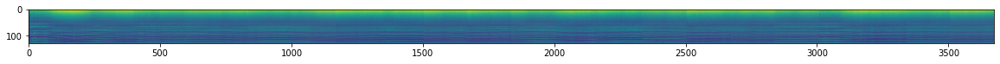

Epoch: [37/100], Step: [0], learning_rate: 0.001, loss: 855813.875000
Epoch: [37/100], Step: [20], learning_rate: 0.001, loss: 858091.375000
Epoch: [37/100], Step: [40], learning_rate: 0.001, loss: 856524.375000
Epoch: [37/100], Step: [60], learning_rate: 0.001, loss: 856813.687500
Epoch: [37/100], Step: [80], learning_rate: 0.001, loss: 856969.000000
Avg loss on test dataset: 860785.16875


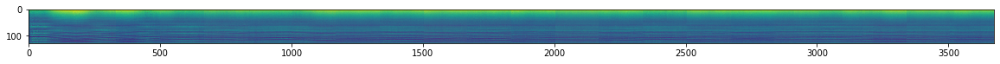

Epoch: [38/100], Step: [0], learning_rate: 0.001, loss: 856859.875000
Epoch: [38/100], Step: [20], learning_rate: 0.001, loss: 856048.312500
Epoch: [38/100], Step: [40], learning_rate: 0.001, loss: 856589.687500
Epoch: [38/100], Step: [60], learning_rate: 0.001, loss: 857970.250000
Epoch: [38/100], Step: [80], learning_rate: 0.001, loss: 857274.062500
Avg loss on test dataset: 860732.55625


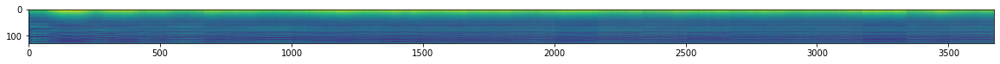

Epoch: [39/100], Step: [0], learning_rate: 0.001, loss: 858769.875000
Epoch: [39/100], Step: [20], learning_rate: 0.001, loss: 857957.562500
Epoch: [39/100], Step: [40], learning_rate: 0.001, loss: 860408.937500
Epoch: [39/100], Step: [60], learning_rate: 0.001, loss: 858751.500000
Epoch: [39/100], Step: [80], learning_rate: 0.001, loss: 857396.812500
Avg loss on test dataset: 861012.4229166667


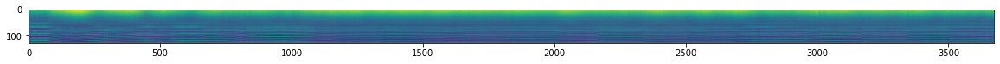

Epoch: [40/100], Step: [0], learning_rate: 0.001, loss: 858674.187500
Epoch: [40/100], Step: [20], learning_rate: 0.001, loss: 861460.750000
Epoch: [40/100], Step: [40], learning_rate: 0.001, loss: 856492.125000
Epoch: [40/100], Step: [60], learning_rate: 0.001, loss: 857443.750000
Epoch: [40/100], Step: [80], learning_rate: 0.001, loss: 857482.437500
Avg loss on test dataset: 860779.6208333333


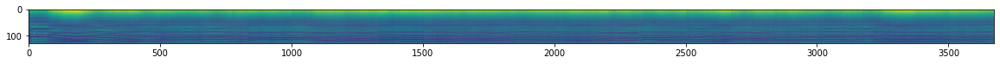

Epoch: [41/100], Step: [0], learning_rate: 0.001, loss: 856482.875000
Epoch: [41/100], Step: [20], learning_rate: 0.001, loss: 857477.375000
Epoch: [41/100], Step: [40], learning_rate: 0.001, loss: 856408.750000
Epoch: [41/100], Step: [60], learning_rate: 0.001, loss: 860134.375000
Epoch: [41/100], Step: [80], learning_rate: 0.001, loss: 856683.125000
Avg loss on test dataset: 860522.5020833333


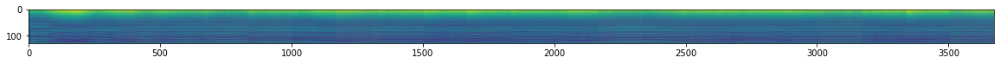

Epoch: [42/100], Step: [0], learning_rate: 0.001, loss: 856989.187500
Epoch: [42/100], Step: [20], learning_rate: 0.001, loss: 858201.125000
Epoch: [42/100], Step: [40], learning_rate: 0.001, loss: 856894.187500
Epoch: [42/100], Step: [60], learning_rate: 0.001, loss: 857217.375000
Epoch: [42/100], Step: [80], learning_rate: 0.001, loss: 855761.312500
Avg loss on test dataset: 861045.1270833333


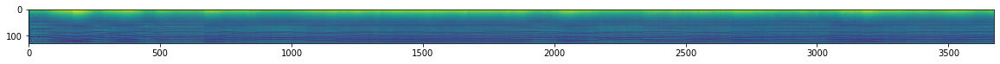

Epoch: [43/100], Step: [0], learning_rate: 0.001, loss: 855344.062500
Epoch: [43/100], Step: [20], learning_rate: 0.001, loss: 856553.000000
Epoch: [43/100], Step: [40], learning_rate: 0.001, loss: 857319.000000
Epoch: [43/100], Step: [60], learning_rate: 0.001, loss: 857143.187500
Epoch: [43/100], Step: [80], learning_rate: 0.001, loss: 856361.125000
Avg loss on test dataset: 861019.7729166667


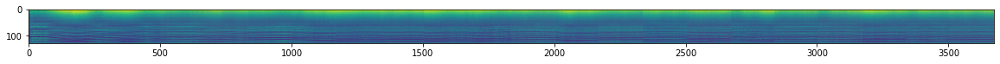

Epoch: [44/100], Step: [0], learning_rate: 0.001, loss: 856692.500000
Epoch: [44/100], Step: [20], learning_rate: 0.001, loss: 856569.375000
Epoch: [44/100], Step: [40], learning_rate: 0.001, loss: 856294.562500
Epoch: [44/100], Step: [60], learning_rate: 0.001, loss: 858268.062500
Epoch: [44/100], Step: [80], learning_rate: 0.001, loss: 861469.062500
Avg loss on test dataset: 860934.98125


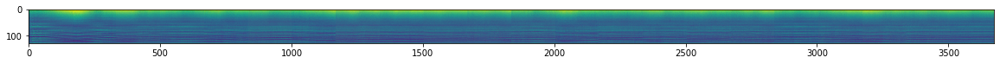

Epoch: [45/100], Step: [0], learning_rate: 0.001, loss: 858064.562500
Epoch: [45/100], Step: [20], learning_rate: 0.001, loss: 855881.312500
Epoch: [45/100], Step: [40], learning_rate: 0.001, loss: 857580.562500
Epoch: [45/100], Step: [60], learning_rate: 0.001, loss: 858284.937500
Epoch: [45/100], Step: [80], learning_rate: 0.001, loss: 857384.500000
Avg loss on test dataset: 860962.6333333333


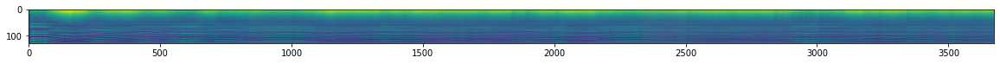

Epoch: [46/100], Step: [0], learning_rate: 0.001, loss: 856299.187500
Epoch: [46/100], Step: [20], learning_rate: 0.001, loss: 857438.562500
Epoch: [46/100], Step: [40], learning_rate: 0.001, loss: 857028.000000
Epoch: [46/100], Step: [60], learning_rate: 0.001, loss: 857196.375000
Epoch: [46/100], Step: [80], learning_rate: 0.001, loss: 855699.562500
Avg loss on test dataset: 860819.5625


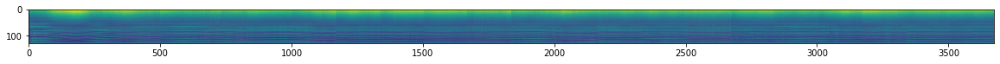

Epoch: [47/100], Step: [0], learning_rate: 0.001, loss: 857791.125000
Epoch: [47/100], Step: [20], learning_rate: 0.001, loss: 856115.562500
Epoch: [47/100], Step: [40], learning_rate: 0.001, loss: 857584.125000
Epoch: [47/100], Step: [60], learning_rate: 0.001, loss: 856719.125000
Epoch: [47/100], Step: [80], learning_rate: 0.001, loss: 856143.562500
Avg loss on test dataset: 860746.85625


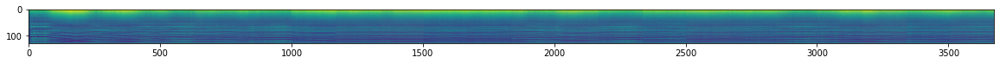

Epoch: [48/100], Step: [0], learning_rate: 0.001, loss: 855779.750000
Epoch: [48/100], Step: [20], learning_rate: 0.001, loss: 856684.562500
Epoch: [48/100], Step: [40], learning_rate: 0.001, loss: 856864.812500
Epoch: [48/100], Step: [60], learning_rate: 0.001, loss: 856811.437500
Epoch: [48/100], Step: [80], learning_rate: 0.001, loss: 856866.375000
Avg loss on test dataset: 861047.1104166667


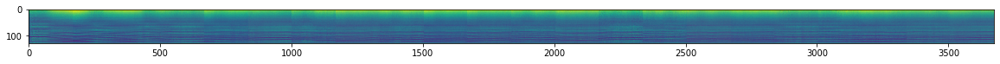

Epoch: [49/100], Step: [0], learning_rate: 0.001, loss: 856007.125000
Epoch: [49/100], Step: [20], learning_rate: 0.001, loss: 857710.750000
Epoch: [49/100], Step: [40], learning_rate: 0.001, loss: 859601.750000
Epoch: [49/100], Step: [60], learning_rate: 0.001, loss: 856691.687500
Epoch: [49/100], Step: [80], learning_rate: 0.001, loss: 856761.000000
Avg loss on test dataset: 861559.2375


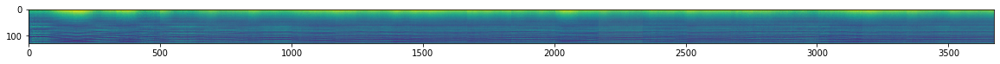

Epoch: [50/100], Step: [0], learning_rate: 0.001, loss: 856111.437500
Epoch: [50/100], Step: [20], learning_rate: 0.001, loss: 855865.062500
Epoch: [50/100], Step: [40], learning_rate: 0.001, loss: 855972.500000
Epoch: [50/100], Step: [60], learning_rate: 0.001, loss: 856748.250000
Epoch: [50/100], Step: [80], learning_rate: 0.001, loss: 856842.375000
Avg loss on test dataset: 861345.8833333333


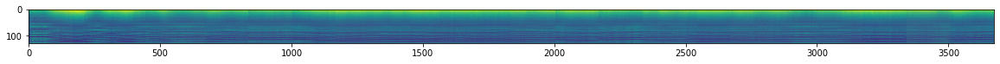

Epoch: [51/100], Step: [0], learning_rate: 0.001, loss: 855099.875000
Epoch: [51/100], Step: [20], learning_rate: 0.001, loss: 857147.437500
Epoch: [51/100], Step: [40], learning_rate: 0.001, loss: 855651.750000
Epoch: [51/100], Step: [60], learning_rate: 0.001, loss: 855561.000000
Epoch: [51/100], Step: [80], learning_rate: 0.001, loss: 857124.625000
Avg loss on test dataset: 861375.9604166667


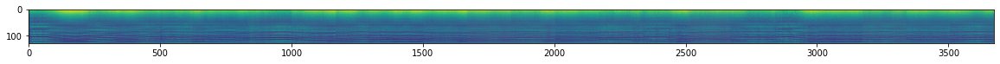

Epoch: [52/100], Step: [0], learning_rate: 0.001, loss: 856148.937500
Epoch: [52/100], Step: [20], learning_rate: 0.001, loss: 856474.562500
Epoch: [52/100], Step: [40], learning_rate: 0.001, loss: 861130.312500
Epoch: [52/100], Step: [60], learning_rate: 0.001, loss: 856248.812500
Epoch: [52/100], Step: [80], learning_rate: 0.001, loss: 857637.437500
Avg loss on test dataset: 861649.9875


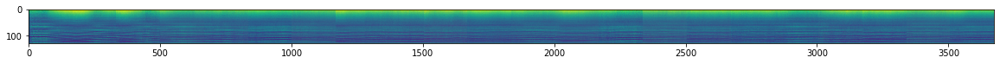

Epoch: [53/100], Step: [0], learning_rate: 0.001, loss: 856742.562500
Epoch: [53/100], Step: [20], learning_rate: 0.001, loss: 857384.687500
Epoch: [53/100], Step: [40], learning_rate: 0.001, loss: 855492.437500
Epoch: [53/100], Step: [60], learning_rate: 0.001, loss: 857885.250000
Epoch: [53/100], Step: [80], learning_rate: 0.001, loss: 858040.562500
Avg loss on test dataset: 861169.7104166667


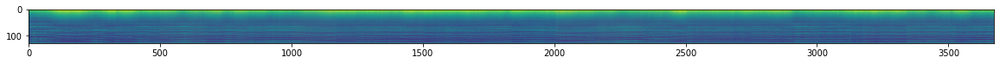

Epoch: [54/100], Step: [0], learning_rate: 0.001, loss: 856858.812500
Epoch: [54/100], Step: [20], learning_rate: 0.001, loss: 856670.375000
Epoch: [54/100], Step: [40], learning_rate: 0.001, loss: 857129.937500
Epoch: [54/100], Step: [60], learning_rate: 0.001, loss: 856042.437500
Epoch: [54/100], Step: [80], learning_rate: 0.001, loss: 855591.625000
Avg loss on test dataset: 861121.6916666667


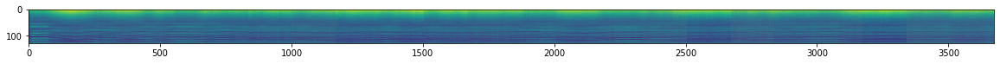

Epoch: [55/100], Step: [0], learning_rate: 0.001, loss: 856254.812500
Epoch: [55/100], Step: [20], learning_rate: 0.001, loss: 857665.625000
Epoch: [55/100], Step: [40], learning_rate: 0.001, loss: 856856.437500
Epoch: [55/100], Step: [60], learning_rate: 0.001, loss: 855790.937500
Epoch: [55/100], Step: [80], learning_rate: 0.001, loss: 856733.875000
Avg loss on test dataset: 861238.9333333333


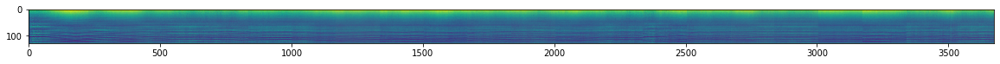

Epoch: [56/100], Step: [0], learning_rate: 0.001, loss: 855320.000000
Epoch: [56/100], Step: [20], learning_rate: 0.001, loss: 856605.562500
Epoch: [56/100], Step: [40], learning_rate: 0.001, loss: 858688.250000
Epoch: [56/100], Step: [60], learning_rate: 0.001, loss: 856314.687500
Epoch: [56/100], Step: [80], learning_rate: 0.001, loss: 855367.187500
Avg loss on test dataset: 861976.9854166667


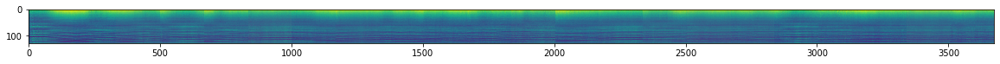

Epoch: [57/100], Step: [0], learning_rate: 0.001, loss: 855895.125000
Epoch: [57/100], Step: [20], learning_rate: 0.001, loss: 856600.062500
Epoch: [57/100], Step: [40], learning_rate: 0.001, loss: 857660.500000
Epoch: [57/100], Step: [60], learning_rate: 0.001, loss: 857266.187500
Epoch: [57/100], Step: [80], learning_rate: 0.001, loss: 855353.312500
Avg loss on test dataset: 862069.4770833333


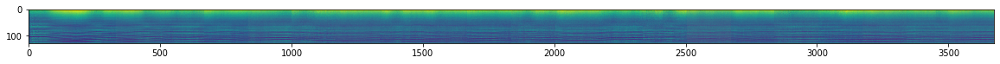

Epoch: [58/100], Step: [0], learning_rate: 0.001, loss: 855200.437500
Epoch: [58/100], Step: [20], learning_rate: 0.001, loss: 857379.312500
Epoch: [58/100], Step: [40], learning_rate: 0.001, loss: 855871.187500
Epoch: [58/100], Step: [60], learning_rate: 0.001, loss: 855269.125000
Epoch: [58/100], Step: [80], learning_rate: 0.001, loss: 855218.500000
Avg loss on test dataset: 861280.5125


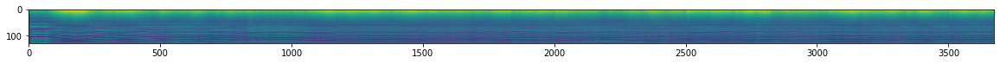

Epoch: [59/100], Step: [0], learning_rate: 0.001, loss: 856170.062500
Epoch: [59/100], Step: [20], learning_rate: 0.001, loss: 855796.500000
Epoch: [59/100], Step: [40], learning_rate: 0.001, loss: 855410.625000
Epoch: [59/100], Step: [60], learning_rate: 0.001, loss: 855861.625000
Epoch: [59/100], Step: [80], learning_rate: 0.001, loss: 856592.750000
Avg loss on test dataset: 862088.2541666667


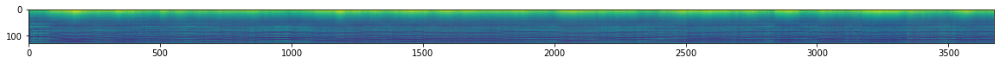

Epoch: [60/100], Step: [0], learning_rate: 0.001, loss: 857138.000000
Epoch: [60/100], Step: [20], learning_rate: 0.001, loss: 856462.125000
Epoch: [60/100], Step: [40], learning_rate: 0.001, loss: 855416.687500
Epoch: [60/100], Step: [60], learning_rate: 0.001, loss: 856493.250000
Epoch: [60/100], Step: [80], learning_rate: 0.001, loss: 855821.812500
Avg loss on test dataset: 862181.5


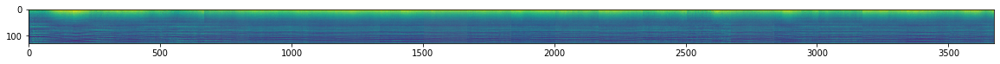

Epoch: [61/100], Step: [0], learning_rate: 0.001, loss: 857962.937500
Epoch: [61/100], Step: [20], learning_rate: 0.001, loss: 855246.937500
Epoch: [61/100], Step: [40], learning_rate: 0.001, loss: 855613.625000
Epoch: [61/100], Step: [60], learning_rate: 0.001, loss: 855600.937500
Epoch: [61/100], Step: [80], learning_rate: 0.001, loss: 855312.687500
Avg loss on test dataset: 862114.01875


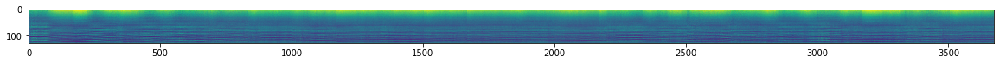

Epoch: [62/100], Step: [0], learning_rate: 0.001, loss: 854265.500000
Epoch: [62/100], Step: [20], learning_rate: 0.001, loss: 856022.562500
Epoch: [62/100], Step: [40], learning_rate: 0.001, loss: 855980.062500
Epoch: [62/100], Step: [60], learning_rate: 0.001, loss: 856096.687500
Epoch: [62/100], Step: [80], learning_rate: 0.001, loss: 857517.062500
Avg loss on test dataset: 862503.5270833333


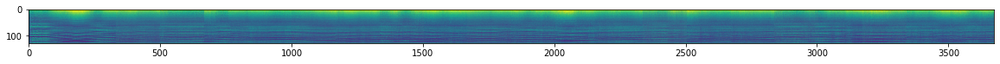

Epoch: [63/100], Step: [0], learning_rate: 0.001, loss: 854797.875000
Epoch: [63/100], Step: [20], learning_rate: 0.001, loss: 855439.500000
Epoch: [63/100], Step: [40], learning_rate: 0.001, loss: 853942.875000
Epoch: [63/100], Step: [60], learning_rate: 0.001, loss: 853899.125000
Epoch: [63/100], Step: [80], learning_rate: 0.001, loss: 855144.312500
Avg loss on test dataset: 862385.1041666666


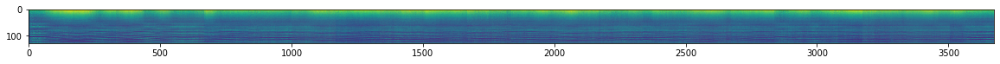

Epoch: [64/100], Step: [0], learning_rate: 0.001, loss: 855325.437500
Epoch: [64/100], Step: [20], learning_rate: 0.001, loss: 854662.187500
Epoch: [64/100], Step: [40], learning_rate: 0.001, loss: 855314.750000
Epoch: [64/100], Step: [60], learning_rate: 0.001, loss: 856518.562500
Epoch: [64/100], Step: [80], learning_rate: 0.001, loss: 856748.562500
Avg loss on test dataset: 862735.3833333333


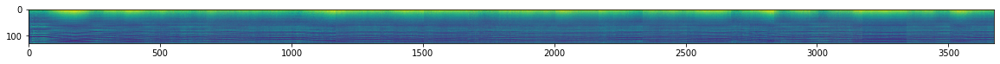

Epoch: [65/100], Step: [0], learning_rate: 0.001, loss: 854819.812500
Epoch: [65/100], Step: [20], learning_rate: 0.001, loss: 854832.312500
Epoch: [65/100], Step: [40], learning_rate: 0.001, loss: 856381.687500
Epoch: [65/100], Step: [60], learning_rate: 0.001, loss: 854515.187500
Epoch: [65/100], Step: [80], learning_rate: 0.001, loss: 854369.375000
Avg loss on test dataset: 862971.7375


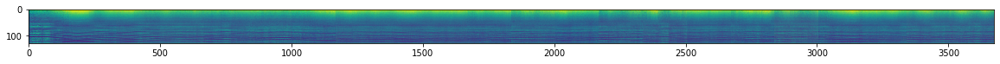

Epoch: [66/100], Step: [0], learning_rate: 0.001, loss: 854911.687500
Epoch: [66/100], Step: [20], learning_rate: 0.001, loss: 854493.187500
Epoch: [66/100], Step: [40], learning_rate: 0.001, loss: 855220.250000
Epoch: [66/100], Step: [60], learning_rate: 0.001, loss: 856009.625000
Epoch: [66/100], Step: [80], learning_rate: 0.001, loss: 856163.562500
Avg loss on test dataset: 863558.2520833333


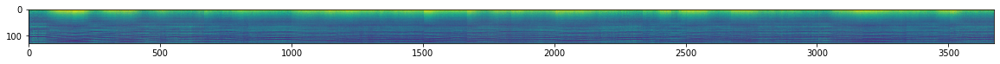

Epoch: [67/100], Step: [0], learning_rate: 0.001, loss: 854360.812500
Epoch: [67/100], Step: [20], learning_rate: 0.001, loss: 854695.875000
Epoch: [67/100], Step: [40], learning_rate: 0.001, loss: 855810.000000
Epoch: [67/100], Step: [60], learning_rate: 0.001, loss: 855035.625000
Epoch: [67/100], Step: [80], learning_rate: 0.001, loss: 854597.562500
Avg loss on test dataset: 863546.5104166666


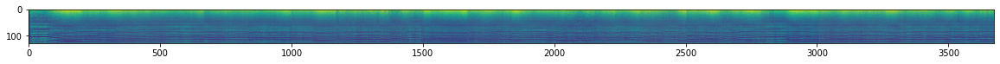

Epoch: [68/100], Step: [0], learning_rate: 0.001, loss: 858717.812500
Epoch: [68/100], Step: [20], learning_rate: 0.001, loss: 854151.125000
Epoch: [68/100], Step: [40], learning_rate: 0.001, loss: 854868.625000
Epoch: [68/100], Step: [60], learning_rate: 0.001, loss: 854046.062500
Epoch: [68/100], Step: [80], learning_rate: 0.001, loss: 855470.000000
Avg loss on test dataset: 863664.9041666667


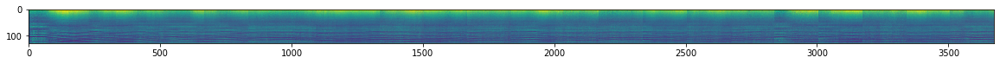

Epoch: [69/100], Step: [0], learning_rate: 0.001, loss: 857522.812500
Epoch: [69/100], Step: [20], learning_rate: 0.001, loss: 855204.312500
Epoch: [69/100], Step: [40], learning_rate: 0.001, loss: 853343.875000
Epoch: [69/100], Step: [60], learning_rate: 0.001, loss: 854087.625000
Epoch: [69/100], Step: [80], learning_rate: 0.001, loss: 855886.750000
Avg loss on test dataset: 863627.4291666667


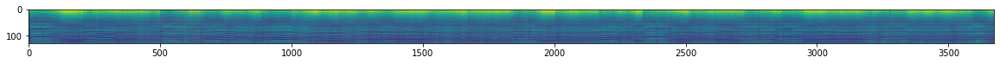

Epoch: [70/100], Step: [0], learning_rate: 0.001, loss: 853783.812500
Epoch: [70/100], Step: [20], learning_rate: 0.001, loss: 854453.437500
Epoch: [70/100], Step: [40], learning_rate: 0.001, loss: 857231.687500
Epoch: [70/100], Step: [60], learning_rate: 0.001, loss: 853089.562500
Epoch: [70/100], Step: [80], learning_rate: 0.001, loss: 854920.312500
Avg loss on test dataset: 863753.4


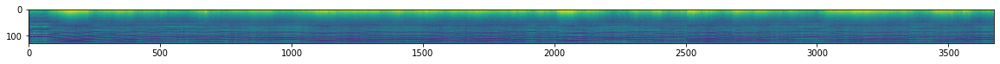

Epoch: [71/100], Step: [0], learning_rate: 0.001, loss: 853469.187500
Epoch: [71/100], Step: [20], learning_rate: 0.001, loss: 856320.687500
Epoch: [71/100], Step: [40], learning_rate: 0.001, loss: 856362.125000
Epoch: [71/100], Step: [60], learning_rate: 0.001, loss: 853820.562500
Epoch: [71/100], Step: [80], learning_rate: 0.001, loss: 856440.750000
Avg loss on test dataset: 864740.5895833333


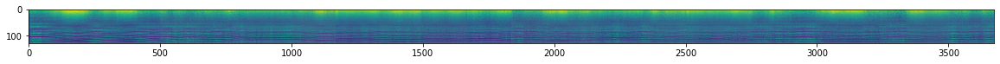

Epoch: [72/100], Step: [0], learning_rate: 0.001, loss: 854457.812500
Epoch: [72/100], Step: [20], learning_rate: 0.001, loss: 852911.250000
Epoch: [72/100], Step: [40], learning_rate: 0.001, loss: 853659.562500
Epoch: [72/100], Step: [60], learning_rate: 0.001, loss: 853804.875000
Epoch: [72/100], Step: [80], learning_rate: 0.001, loss: 855846.750000
Avg loss on test dataset: 863955.8395833333


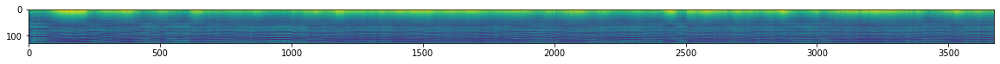

Epoch: [73/100], Step: [0], learning_rate: 0.001, loss: 853210.312500
Epoch: [73/100], Step: [20], learning_rate: 0.001, loss: 852019.875000
Epoch: [73/100], Step: [40], learning_rate: 0.001, loss: 854561.000000
Epoch: [73/100], Step: [60], learning_rate: 0.001, loss: 854802.812500
Epoch: [73/100], Step: [80], learning_rate: 0.001, loss: 855119.750000
Avg loss on test dataset: 866037.11875


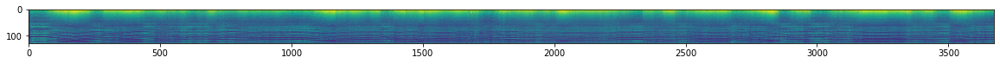

Epoch: [74/100], Step: [0], learning_rate: 0.001, loss: 853369.812500
Epoch: [74/100], Step: [20], learning_rate: 0.001, loss: 854289.250000
Epoch: [74/100], Step: [40], learning_rate: 0.001, loss: 853650.437500
Epoch: [74/100], Step: [60], learning_rate: 0.001, loss: 853098.312500
Epoch: [74/100], Step: [80], learning_rate: 0.001, loss: 854050.875000
Avg loss on test dataset: 865065.4541666667


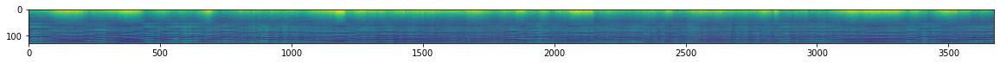

Epoch: [75/100], Step: [0], learning_rate: 0.001, loss: 852352.250000
Epoch: [75/100], Step: [20], learning_rate: 0.001, loss: 852350.500000
Epoch: [75/100], Step: [40], learning_rate: 0.001, loss: 852893.187500
Epoch: [75/100], Step: [60], learning_rate: 0.001, loss: 852197.500000
Epoch: [75/100], Step: [80], learning_rate: 0.001, loss: 852732.000000
Avg loss on test dataset: 864893.5145833333


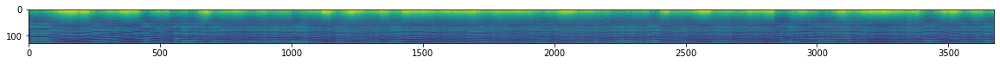

Epoch: [76/100], Step: [0], learning_rate: 0.001, loss: 852330.250000
Epoch: [76/100], Step: [20], learning_rate: 0.001, loss: 852758.062500
Epoch: [76/100], Step: [40], learning_rate: 0.001, loss: 853718.250000
Epoch: [76/100], Step: [60], learning_rate: 0.001, loss: 855536.125000
Epoch: [76/100], Step: [80], learning_rate: 0.001, loss: 853143.250000
Avg loss on test dataset: 865132.86875


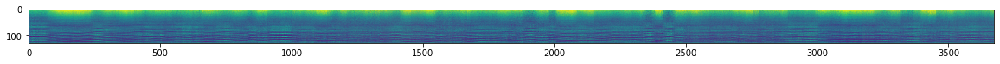

Epoch: [77/100], Step: [0], learning_rate: 0.001, loss: 851403.187500
Epoch: [77/100], Step: [20], learning_rate: 0.001, loss: 851596.437500
Epoch: [77/100], Step: [40], learning_rate: 0.001, loss: 851583.125000
Epoch: [77/100], Step: [60], learning_rate: 0.001, loss: 852288.687500
Epoch: [77/100], Step: [80], learning_rate: 0.001, loss: 853074.687500
Avg loss on test dataset: 865833.03125


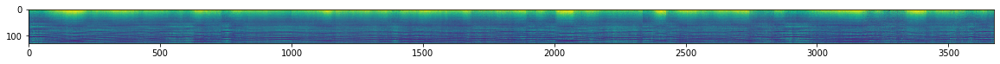

Epoch: [78/100], Step: [0], learning_rate: 0.001, loss: 851516.625000
Epoch: [78/100], Step: [20], learning_rate: 0.001, loss: 851777.812500
Epoch: [78/100], Step: [40], learning_rate: 0.001, loss: 853440.375000
Epoch: [78/100], Step: [60], learning_rate: 0.001, loss: 852545.500000
Epoch: [78/100], Step: [80], learning_rate: 0.001, loss: 852341.562500
Avg loss on test dataset: 865034.0604166667


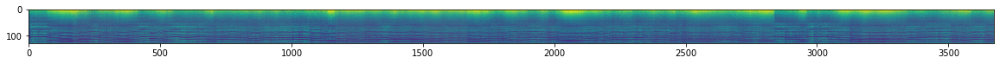

Epoch: [79/100], Step: [0], learning_rate: 0.001, loss: 851512.812500
Epoch: [79/100], Step: [20], learning_rate: 0.001, loss: 851625.062500
Epoch: [79/100], Step: [40], learning_rate: 0.001, loss: 852865.437500
Epoch: [79/100], Step: [60], learning_rate: 0.001, loss: 852448.250000
Epoch: [79/100], Step: [80], learning_rate: 0.001, loss: 852054.312500
Avg loss on test dataset: 866071.1458333334


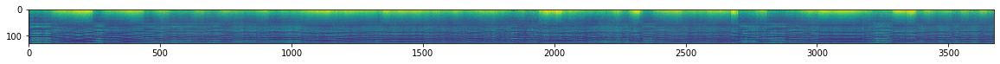

Epoch: [80/100], Step: [0], learning_rate: 0.001, loss: 851527.750000
Epoch: [80/100], Step: [20], learning_rate: 0.001, loss: 850565.625000
Epoch: [80/100], Step: [40], learning_rate: 0.001, loss: 852508.375000
Epoch: [80/100], Step: [60], learning_rate: 0.001, loss: 852017.562500
Epoch: [80/100], Step: [80], learning_rate: 0.001, loss: 852381.062500
Avg loss on test dataset: 866312.1


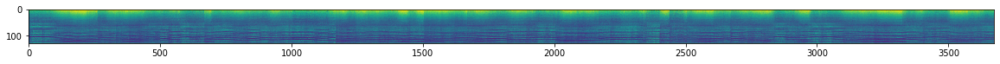

Epoch: [81/100], Step: [0], learning_rate: 0.001, loss: 851253.187500
Epoch: [81/100], Step: [20], learning_rate: 0.001, loss: 851845.250000
Epoch: [81/100], Step: [40], learning_rate: 0.001, loss: 851640.125000
Epoch: [81/100], Step: [60], learning_rate: 0.001, loss: 851410.375000
Epoch: [81/100], Step: [80], learning_rate: 0.001, loss: 851769.437500
Avg loss on test dataset: 865778.71875


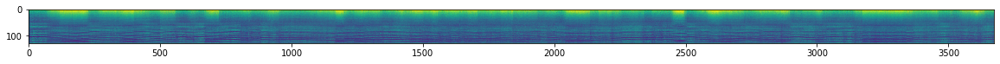

Epoch: [82/100], Step: [0], learning_rate: 0.001, loss: 851247.062500
Epoch: [82/100], Step: [20], learning_rate: 0.001, loss: 850528.750000
Epoch: [82/100], Step: [40], learning_rate: 0.001, loss: 850938.062500
Epoch: [82/100], Step: [60], learning_rate: 0.001, loss: 851361.000000
Epoch: [82/100], Step: [80], learning_rate: 0.001, loss: 850561.875000
Avg loss on test dataset: 866991.8833333333


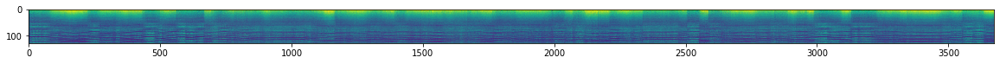

Epoch: [83/100], Step: [0], learning_rate: 0.001, loss: 850127.437500
Epoch: [83/100], Step: [20], learning_rate: 0.001, loss: 850169.250000
Epoch: [83/100], Step: [40], learning_rate: 0.001, loss: 850521.062500
Epoch: [83/100], Step: [60], learning_rate: 0.001, loss: 851068.062500
Epoch: [83/100], Step: [80], learning_rate: 0.001, loss: 850617.750000
Avg loss on test dataset: 866415.0270833333


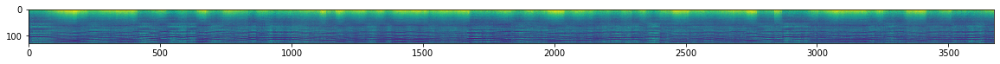

Epoch: [84/100], Step: [0], learning_rate: 0.001, loss: 850272.937500
Epoch: [84/100], Step: [20], learning_rate: 0.001, loss: 849760.125000
Epoch: [84/100], Step: [40], learning_rate: 0.001, loss: 851589.625000
Epoch: [84/100], Step: [60], learning_rate: 0.001, loss: 851146.312500
Epoch: [84/100], Step: [80], learning_rate: 0.001, loss: 851019.812500
Avg loss on test dataset: 866515.3479166667


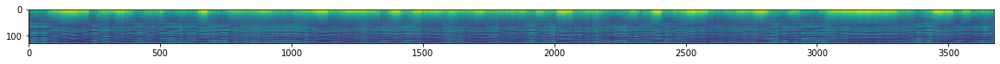

Epoch: [85/100], Step: [0], learning_rate: 0.001, loss: 849195.187500
Epoch: [85/100], Step: [20], learning_rate: 0.001, loss: 849784.875000
Epoch: [85/100], Step: [40], learning_rate: 0.001, loss: 850546.937500
Epoch: [85/100], Step: [60], learning_rate: 0.001, loss: 850380.875000
Epoch: [85/100], Step: [80], learning_rate: 0.001, loss: 850526.500000
Avg loss on test dataset: 866613.08125


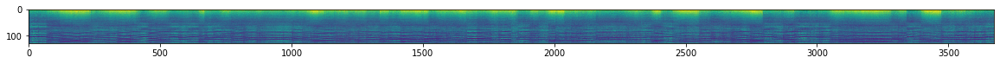

Epoch: [86/100], Step: [0], learning_rate: 0.001, loss: 849940.062500
Epoch: [86/100], Step: [20], learning_rate: 0.001, loss: 849686.687500
Epoch: [86/100], Step: [40], learning_rate: 0.001, loss: 850506.562500
Epoch: [86/100], Step: [60], learning_rate: 0.001, loss: 851502.812500
Epoch: [86/100], Step: [80], learning_rate: 0.001, loss: 850462.062500
Avg loss on test dataset: 867438.16875


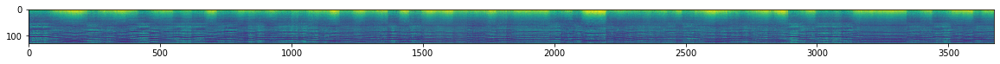

Epoch: [87/100], Step: [0], learning_rate: 0.001, loss: 848798.312500
Epoch: [87/100], Step: [20], learning_rate: 0.001, loss: 850769.375000
Epoch: [87/100], Step: [40], learning_rate: 0.001, loss: 849119.125000
Epoch: [87/100], Step: [60], learning_rate: 0.001, loss: 849335.187500
Epoch: [87/100], Step: [80], learning_rate: 0.001, loss: 849766.875000
Avg loss on test dataset: 867244.9229166667


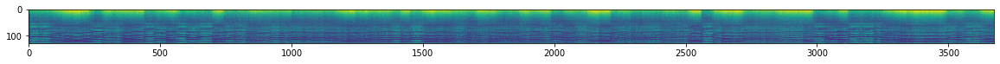

Epoch: [88/100], Step: [0], learning_rate: 0.001, loss: 848192.625000
Epoch: [88/100], Step: [20], learning_rate: 0.001, loss: 849408.187500
Epoch: [88/100], Step: [40], learning_rate: 0.001, loss: 849675.437500
Epoch: [88/100], Step: [60], learning_rate: 0.001, loss: 849482.812500
Epoch: [88/100], Step: [80], learning_rate: 0.001, loss: 849893.125000
Avg loss on test dataset: 867058.2958333333


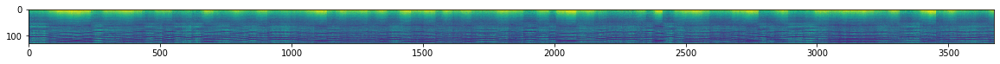

Epoch: [89/100], Step: [0], learning_rate: 0.001, loss: 848060.375000
Epoch: [89/100], Step: [20], learning_rate: 0.001, loss: 848975.062500
Epoch: [89/100], Step: [40], learning_rate: 0.001, loss: 849335.250000
Epoch: [89/100], Step: [60], learning_rate: 0.001, loss: 849651.500000
Epoch: [89/100], Step: [80], learning_rate: 0.001, loss: 849481.250000
Avg loss on test dataset: 867138.1145833334


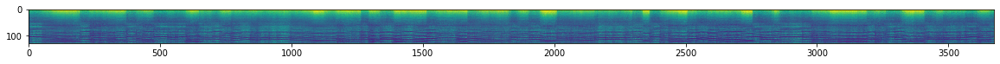

Epoch: [90/100], Step: [0], learning_rate: 0.001, loss: 849413.937500
Epoch: [90/100], Step: [20], learning_rate: 0.001, loss: 848235.312500
Epoch: [90/100], Step: [40], learning_rate: 0.001, loss: 848932.000000
Epoch: [90/100], Step: [60], learning_rate: 0.001, loss: 848557.437500
Epoch: [90/100], Step: [80], learning_rate: 0.001, loss: 848174.687500
Avg loss on test dataset: 867967.81875


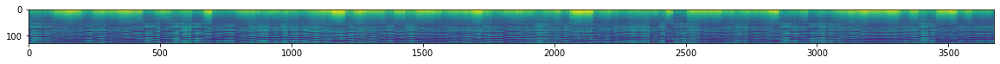

Epoch: [91/100], Step: [0], learning_rate: 0.001, loss: 847765.125000
Epoch: [91/100], Step: [20], learning_rate: 0.001, loss: 848752.937500
Epoch: [91/100], Step: [40], learning_rate: 0.001, loss: 848578.562500
Epoch: [91/100], Step: [60], learning_rate: 0.001, loss: 849118.875000
Epoch: [91/100], Step: [80], learning_rate: 0.001, loss: 850213.375000
Avg loss on test dataset: 868335.9666666667


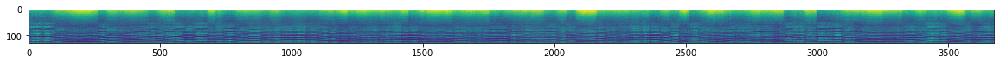

Epoch: [92/100], Step: [0], learning_rate: 0.001, loss: 848793.062500
Epoch: [92/100], Step: [20], learning_rate: 0.001, loss: 849051.375000
Epoch: [92/100], Step: [40], learning_rate: 0.001, loss: 848300.000000
Epoch: [92/100], Step: [60], learning_rate: 0.001, loss: 848552.562500
Epoch: [92/100], Step: [80], learning_rate: 0.001, loss: 848978.687500
Avg loss on test dataset: 868508.8875


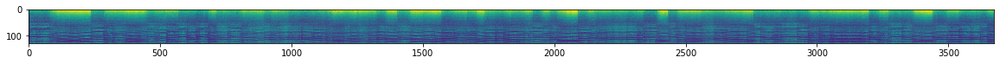

Epoch: [93/100], Step: [0], learning_rate: 0.001, loss: 848596.625000
Epoch: [93/100], Step: [20], learning_rate: 0.001, loss: 848655.250000
Epoch: [93/100], Step: [40], learning_rate: 0.001, loss: 848503.062500
Epoch: [93/100], Step: [60], learning_rate: 0.001, loss: 849037.937500
Epoch: [93/100], Step: [80], learning_rate: 0.001, loss: 847788.937500
Avg loss on test dataset: 868152.6458333334


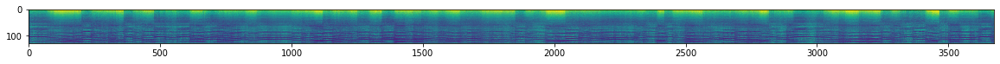

Epoch: [94/100], Step: [0], learning_rate: 0.001, loss: 848567.812500
Epoch: [94/100], Step: [20], learning_rate: 0.001, loss: 847538.125000
Epoch: [94/100], Step: [40], learning_rate: 0.001, loss: 848012.437500
Epoch: [94/100], Step: [60], learning_rate: 0.001, loss: 848900.062500
Epoch: [94/100], Step: [80], learning_rate: 0.001, loss: 848004.750000
Avg loss on test dataset: 868070.68125


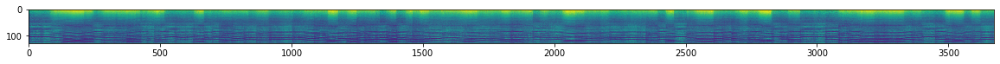

Epoch: [95/100], Step: [0], learning_rate: 0.001, loss: 847448.437500
Epoch: [95/100], Step: [20], learning_rate: 0.001, loss: 848107.125000
Epoch: [95/100], Step: [40], learning_rate: 0.001, loss: 848793.687500
Epoch: [95/100], Step: [60], learning_rate: 0.001, loss: 848204.000000
Epoch: [95/100], Step: [80], learning_rate: 0.001, loss: 848302.500000
Avg loss on test dataset: 868950.2270833333


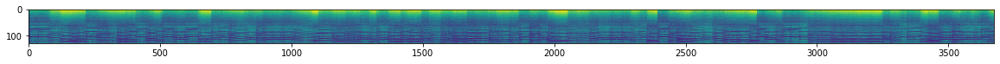

Epoch: [96/100], Step: [0], learning_rate: 0.001, loss: 847471.437500
Epoch: [96/100], Step: [20], learning_rate: 0.001, loss: 847159.062500
Epoch: [96/100], Step: [40], learning_rate: 0.001, loss: 847788.750000
Epoch: [96/100], Step: [60], learning_rate: 0.001, loss: 847682.000000
Epoch: [96/100], Step: [80], learning_rate: 0.001, loss: 848074.687500
Avg loss on test dataset: 868240.3583333333


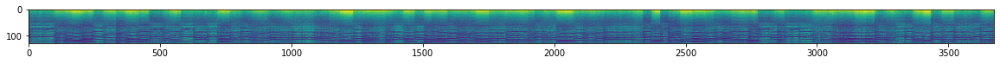

Epoch: [97/100], Step: [0], learning_rate: 0.001, loss: 847557.312500
Epoch: [97/100], Step: [20], learning_rate: 0.001, loss: 847803.437500
Epoch: [97/100], Step: [40], learning_rate: 0.001, loss: 847950.000000
Epoch: [97/100], Step: [60], learning_rate: 0.001, loss: 847963.625000
Epoch: [97/100], Step: [80], learning_rate: 0.001, loss: 847118.312500
Avg loss on test dataset: 868046.35


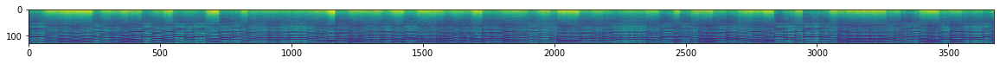

Epoch: [98/100], Step: [0], learning_rate: 0.001, loss: 847754.625000
Epoch: [98/100], Step: [20], learning_rate: 0.001, loss: 847358.500000
Epoch: [98/100], Step: [40], learning_rate: 0.001, loss: 847553.000000
Epoch: [98/100], Step: [60], learning_rate: 0.001, loss: 848005.500000
Epoch: [98/100], Step: [80], learning_rate: 0.001, loss: 847267.125000
Avg loss on test dataset: 867822.6729166667


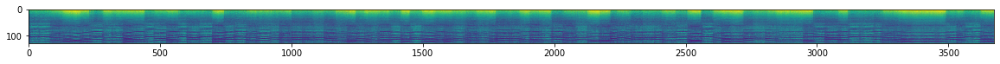

Epoch: [99/100], Step: [0], learning_rate: 0.001, loss: 846145.812500
Epoch: [99/100], Step: [20], learning_rate: 0.001, loss: 847947.625000
Epoch: [99/100], Step: [40], learning_rate: 0.001, loss: 847307.687500
Epoch: [99/100], Step: [60], learning_rate: 0.001, loss: 848044.062500
Epoch: [99/100], Step: [80], learning_rate: 0.001, loss: 847765.750000
Avg loss on test dataset: 869404.8375


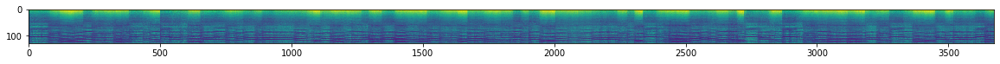

Epoch: [100/100], Step: [0], learning_rate: 0.001, loss: 847305.125000
Epoch: [100/100], Step: [20], learning_rate: 0.001, loss: 847815.500000
Epoch: [100/100], Step: [40], learning_rate: 0.001, loss: 847824.000000
Epoch: [100/100], Step: [60], learning_rate: 0.001, loss: 847858.875000
Epoch: [100/100], Step: [80], learning_rate: 0.001, loss: 847625.125000
Avg loss on test dataset: 867998.8041666667
Training Done!


In [8]:
epochs = 100
lr = 0.001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # torch.device("cpu") 

# net = Model(hidden_dim=16, latent_size=64, batch_size=batch_size, img_size=(650,215), chunk_counts=(13,5))
net = Model(hidden_dim=16, latent_size=64, batch_size=batch_size, img_size=(3674,128), chunk_counts=(22,1))

net.to(device)

optimizer = torch.optim.Adam(net.parameters(), lr=lr)

# net.to(device)
net.cuda()

cur_loss = 0
best_loss = float('inf')

debug = False

print("Training start!")

for epoch in range(1, epochs+1):
    net.train()

    for i, batch in enumerate(train_loader):

        x, y = batch[0].to(device), batch[1].to(device)

        net.zero_grad()

        mean, logvar, y_hat = net.forward(x)#.transpose(1,2)
        if debug:
            print("y max", torch.max(y), " y min", torch.min(y))
            print("y nan", (torch.sum(torch.isnan(y)) > 0))
            print("y hat max", torch.max(y_hat), " y hat min", torch.min(y_hat))
            print("y hat nan", (torch.sum(torch.isnan(y_hat)) > 0))

        loss = compute_loss(y, y_hat, mean, logvar)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if i == 0:
            imshow(y_hat[0].cpu().detach())

        if i % 20 == 0:
            print('Epoch: [{}/{}], Step: [{}], '
                'learning_rate: {}, '
                'loss: {:4f}'
                .format(epoch, epochs, i, lr, loss.item()))
            
    
    print(f'Avg loss on test dataset: {evaluate(net, test_loader)}')


print('Training Done!')

In [28]:
with torch.no_grad():
#     for i, batch in enumerate(train_loader):
#         x, _ = batch[0].to(device), batch[1].to(device)
#         _, _, y_hat = net.forward(x)#.transpose(1,2)
#         y_hat = torch.sum(y_hat[0],0)
#         print(y_hat.shape)
#         spectrogram_to_wav(y_hat.cpu().numpy(), "generated_outputs/train" + str(i) + ".wav")
        
    for i, batch in enumerate(test_loader):
        x, _ = batch[0].to(device), batch[1].to(device)
        _, _, y_hat = net.forward(x)#.transpose(1,2)
        y_hat = torch.sum(y_hat[0],0)
        spectrogram_to_wav(y_hat.cpu().numpy(), "generated_outputs/test" + str(i) + ".wav")


KeyboardInterrupt: 

In [29]:
torch.save(net, "best_net.pt")